In [129]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import sklearn
import folium
import geopy

## dataframe dictionary

* `nyc_gdf` = inital imported gdf <br>
* `nyc_gdf1` = projected gdf to EPSG:4326 
* `nyc_gdf2` = `nyc_gdf1` with binary values for boolean variables
* `nyc_gdf3` = `nyc_gdf2` groupby hectare (proportions for boolean variables)

## mapping by hectare

1. convert dataframe into geodataframe
2. convert boolean values into binary
3. map based on human interaction, movement, communication
4. map distribution per hectare based on date and shift

In [130]:
nyc_gdf = gpd.read_file('../dataframes/nycsquirrels_clean_1.csv')
nyc_gdf = gpd.GeoDataFrame(nyc_gdf, geometry = gpd.points_from_xy(nyc_gdf.long, nyc_gdf.lat))

In [131]:
nyc_gdf1 = nyc_gdf.set_crs('EPSG:4326')

In [132]:
nyc_gdf1.explore()

In [133]:
nyc_gdf1.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2968 entries, 0 to 2967
Data columns (total 31 columns):
 #   Column                                      Non-Null Count  Dtype   
---  ------                                      --------------  -----   
 0   long                                        2968 non-null   object  
 1   lat                                         2968 non-null   object  
 2   unique_squirrel_id                          2968 non-null   object  
 3   hectare                                     2968 non-null   object  
 4   shift                                       2968 non-null   object  
 5   date                                        2968 non-null   object  
 6   hectare_squirrel_number                     2968 non-null   object  
 7   age                                         2968 non-null   object  
 8   primary_fur_color                           2968 non-null   object  
 9   combination_of_primary_and_highlight_color  2968 non-null   object

In [134]:
prim_fur_color_map = {'Gray': 'green', 'Cinnamon': '#8c5f15', 'Black': '#0a2340'}
# nyc_gdf1.explore('primary_fur_color',
                 # color=nyc_gdf1['primary_fur_color'].map(prim_fur_color_map))

In [135]:
def convert_bool_to_int(boolean):
    if boolean == 'TRUE':
        return 1
    elif boolean == 'FALSE':
        return 0

def convert_coord_to_float(coord):
    return float(coord)

long_float = nyc_gdf1['long'].apply(convert_coord_to_float)
lat_float = nyc_gdf1['lat'].apply(convert_coord_to_float)
    
approaches_int = nyc_gdf1['approaches'].apply(convert_bool_to_int)
indifferent_int = nyc_gdf1['indifferent'].apply(convert_bool_to_int)
runs_from_int = nyc_gdf1['runs_from'].apply(convert_bool_to_int)

nyc_gdf2 = nyc_gdf1.assign(long = long_float,
                           lat = lat_float,
                           approaches = approaches_int,
                           indifferent = indifferent_int,
                           runs_from = runs_from_int)

nyc_gdf3 = nyc_gdf2.groupby('hectare').mean()

hectare_freq = nyc_gdf2.groupby('hectare').count().get('long')

human_int_gdf = gpd.GeoDataFrame(nyc_gdf3, geometry = gpd.points_from_xy(nyc_gdf3.long, nyc_gdf3.lat))
human_int_gdf = human_int_gdf.set_crs('EPSG:4326').assign(hectare_freq = hectare_freq)
hectare_freq

hectare
01A    11
01B    27
01C    12
01D    16
01E     8
       ..
42E     6
42F     6
42G     6
42H     6
42I     3
Name: long, Length: 338, dtype: int64

### Human Interaction Plot
#### Set column to 'approaches', 'indifferent', or 'runs_from'

We see that squirrels rarely approach humans.

We see that squirrels are most likely to be indifferent towards humans. 

We see that sqiurrels are most likely to run from humans at the north-west part of the park.

<AxesSubplot:>

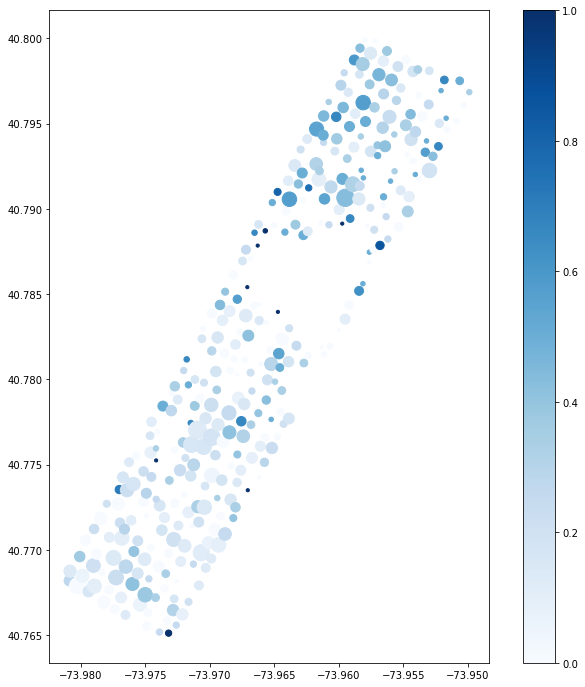

In [136]:
human_int_gdf['hectare_freq_markersize'] = human_int_gdf['hectare_freq'] * 10
human_int_gdf.plot(column = 'runs_from', 
                   markersize = 'hectare_freq_markersize', 
                   cmap = 'Blues',
                   figsize = (12, 12), 
                   legend = True)

In [137]:
nyc_gdf2.columns

Index(['long', 'lat', 'unique_squirrel_id', 'hectare', 'shift', 'date',
       'hectare_squirrel_number', 'age', 'primary_fur_color',
       'combination_of_primary_and_highlight_color', 'location',
       'above_ground_sighter_measurement', 'running', 'chasing', 'climbing',
       'eating', 'foraging', 'kuks', 'quaas', 'moans', 'tail_flags',
       'tail_twitches', 'approaches', 'indifferent', 'runs_from', 'lat_long',
       'community_districts', 'borough_boundaries', 'city_council_districts',
       'police_precincts', 'geometry'],
      dtype='object')

In [138]:
movement = ['running', 'chasing', 'climbing', 'eating', 'foraging']

running_int = nyc_gdf2['running'].apply(convert_bool_to_int)
chasing_int = nyc_gdf2['chasing'].apply(convert_bool_to_int)
climbing_int = nyc_gdf2['climbing'].apply(convert_bool_to_int)
eating_int = nyc_gdf2['eating'].apply(convert_bool_to_int)
foraging_int = nyc_gdf2['foraging'].apply(convert_bool_to_int)

nyc_gdf2 = nyc_gdf2.assign(running = running_int,
                          chasing = chasing_int,
                          climbing = climbing_int,
                          eating = eating_int,
                          foraging = foraging_int)

In [139]:
nyc_gdf3 = nyc_gdf2.groupby('hectare').mean()

movement_gdf = gpd.GeoDataFrame(nyc_gdf3, geometry = gpd.points_from_xy(nyc_gdf3.long, nyc_gdf3.lat))
movement_gdf = movement_gdf.set_crs('EPSG:4326').assign(hectare_freq = hectare_freq)
movement_gdf['hectare_freq_markersize'] = movement_gdf['hectare_freq'] * 10

### Movement Plot
#### Set column to 'running', 'chasing', 'climbing', 'eating', or 'foraging'

We see that foraging is the most freqeunt movement.

There is some spatial correlation for eating and foraging.

One could predict that squirrels would be more likely to be seen climbing a tree where there a lot of trees. That is not the case.

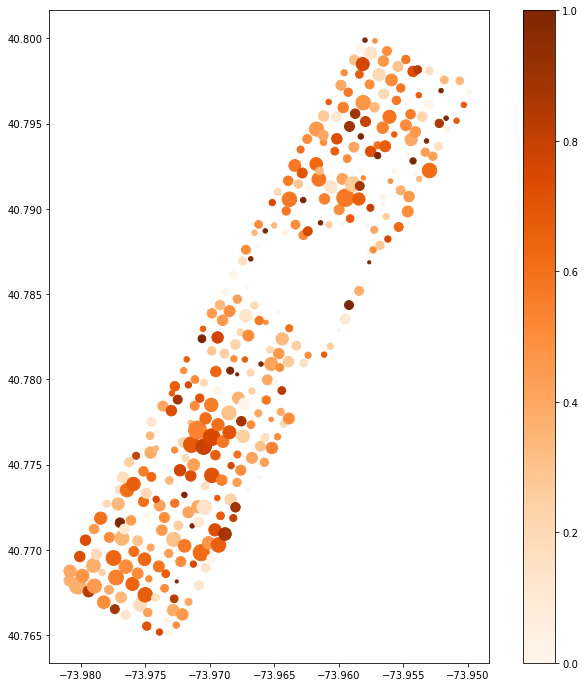

In [140]:
movement_gdf.plot(column = 'foraging',
                  markersize = 'hectare_freq_markersize',
                  cmap = 'Oranges',
                  figsize = (12, 12),
                  legend = True);

In [141]:
communication = ['kuks', 'quaas', 'moans', 'tail_flags', 'tail_twitches']

kuks_int = nyc_gdf2['kuks'].apply(convert_bool_to_int)
quaas_int = nyc_gdf2['quaas'].apply(convert_bool_to_int)
moans_int = nyc_gdf2['moans'].apply(convert_bool_to_int)
tail_flags_int = nyc_gdf2['tail_flags'].apply(convert_bool_to_int)
tail_twitches_int = nyc_gdf2['tail_twitches'].apply(convert_bool_to_int)

nyc_gdf2 = nyc_gdf2.assign(kuks = kuks_int,
                           quaas = quaas_int,
                           moans = moans_int,
                           tail_flags = tail_flags_int,
                           tail_twitches = tail_twitches_int)

nyc_gdf3 = nyc_gdf2.groupby('hectare').mean()

In [142]:
communication_gdf = gpd.GeoDataFrame(nyc_gdf3, geometry = gpd.points_from_xy(nyc_gdf3.long, nyc_gdf3.lat))
communication_gdf = communication_gdf.set_crs('EPSG:4326').assign(hectare_freq = hectare_freq)
communication_gdf['hectare_freq_markersize'] = communication_gdf['hectare_freq'] * 10

### Communication Plot
#### Set column to 'kuks', 'quaas', 'moans', 'tail_flags', or 'tail_twitches'
We see that this information is not very accurate or reliable. 

It is difficult for human observers to keep track of how the squirrels are communicating. 

There is a lot of outside noise and the observer may not be able to hear the sounds of the squirrels. 

Additionally, it is hard to see the tail movements when the squirrel is running fast. 

It is subjective and there may not be a clear distinction between what a tail flag is and what a tail twitch is.

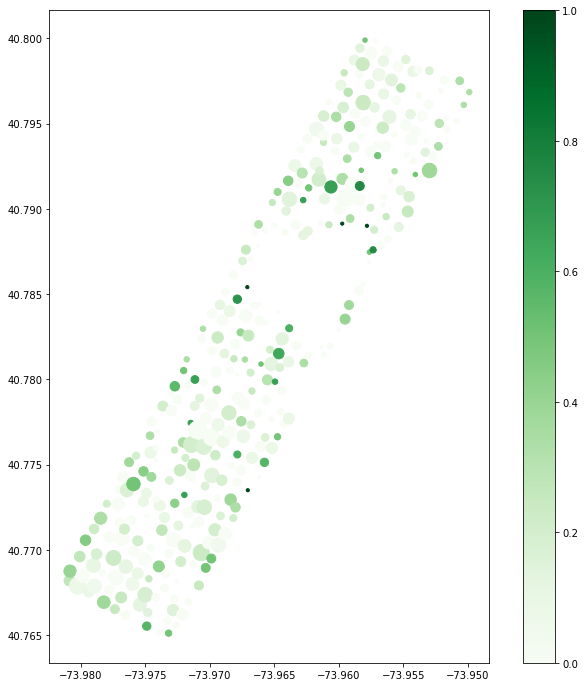

In [143]:
communication_gdf.plot(column = 'tail_twitches',
                      markersize = 'hectare_freq_markersize',
                      cmap = 'Greens',
                      figsize = (12, 12),
                      legend = True);

In [144]:
freq_check_col = ['long', 'lat', 'hectare', 'shift', 'date']
freq_check = nyc_gdf2.get(freq_check_col)
freq_check

,long,lat,hectare,shift,date
0,-73.957044,40.794851,37E,PM,10062018
1,-73.976831,40.766718,02E,AM,10102018
2,-73.975725,40.769703,05D,PM,10182018
3,-73.956570,40.790256,33H,AM,10192018
4,-73.971974,40.769305,06G,PM,10202018
...,...,...,...,...,...
2963,-73.963943,40.790868,30B,AM,10072018
2964,-73.970402,40.782560,19A,PM,10132018
2965,-73.966587,40.783678,22D,PM,10122018
2966,-73.963994,40.789915,29B,PM,10102018


In [145]:
freq_check_coord = freq_check.groupby(['hectare', 'date', 'shift']).mean()
freq_check_count = freq_check.groupby(['hectare', 'date', 'shift']).count()
freq_check_gdf = gpd.GeoDataFrame(freq_check_coord, 
                                  geometry = gpd.points_from_xy(freq_check_coord.long, freq_check_coord.lat))
freq_check_gdf = freq_check_gdf.set_crs('EPSG:4326')

In [146]:
freq_check_gdf['count'] = freq_check_count['long']
freq_check_gdf['markersize'] = freq_check_gdf['count'] * 10
freq_check_gdf

long        lat                    geometry  \
hectare date     shift                                                     
01A     10072018 AM    -73.980895  40.767989  POINT (-73.98089 40.76799)   
        10142018 PM    -73.980883  40.768317  POINT (-73.98088 40.76832)   
01B     10122018 AM    -73.980221  40.767903  POINT (-73.98022 40.76790)   
        10192018 PM    -73.980274  40.767875  POINT (-73.98027 40.76787)   
01C     10122018 AM    -73.979678  40.767300  POINT (-73.97968 40.76730)   
...                           ...        ...                         ...   
42G     10142018 PM    -73.952014  40.797549  POINT (-73.95201 40.79755)   
        10182018 AM    -73.951657  40.797583  POINT (-73.95166 40.79758)   
42H     10142018 PM    -73.950580  40.797641  POINT (-73.95058 40.79764)   
        10192018 AM    -73.950772  40.797268  POINT (-73.95077 40.79727)   
42I     10142018 PM    -73.949903  40.796850  POINT (-73.94990 40.79685)   

                        count  markersize  
hectare date     shift                     
01A     10072018 AM         4          40  
        10142018 PM         7          70  
01B     10122018 AM        17         170  
        10192018 PM        10         100  
01C     10122018 AM         2          20  
...                       ...         ...  
42G     10142018 PM         3          30  
        10182018 AM         3          30  
42H     10142018 PM         4          40  
        10192018 AM         2          20  
42I     10142018 PM         3          30  

[611 rows x 5 columns]

In [147]:
def hectare_index(row, hectareindex):
    return [index for index in hectareindex if row in index[0]]

hectare_row = '01'

freq_check_noindex = freq_check_gdf.reset_index()
freq_check_barplot = freq_check_noindex[['hectare', 'date', 'shift', 'geometry', 'count', 'markersize']]
freq_check_01 = freq_check_barplot[freq_check_barplot.get('hectare').str.contains(hectare_row)]
freq_check_01

,hectare,date,shift,geometry,count,markersize
0,01A,10072018,AM,POINT (-73.98089 40.76799),4,40
1,01A,10142018,PM,POINT (-73.98088 40.76832),7,70
2,01B,10122018,AM,POINT (-73.98022 40.76790),17,170
3,01B,10192018,PM,POINT (-73.98027 40.76787),10,100
4,01C,10122018,AM,POINT (-73.97968 40.76730),2,20
5,01C,10132018,PM,POINT (-73.97934 40.76761),10,100
6,01D,10062018,AM,POINT (-73.97830 40.76694),9,90
7,01D,10072018,PM,POINT (-73.97811 40.76692),7,70
8,01E,10062018,AM,POINT (-73.97739 40.76652),5,50
9,01E,10072018,PM,POINT (-73.97732 40.76653),3,30


In [148]:
freq_check_01_pivot = freq_check_01.pivot(index = 'hectare', columns = 'shift', values = 'count')
freq_check_01_pivot

shift,AM,PM
hectare,,
01A,4.0,7.0
01B,17.0,10.0
01C,2.0,10.0
01D,9.0,7.0
01E,5.0,3.0
01F,5.0,3.0
01G,4.0,3.0
01H,2.0,2.0
01I,NaN,4.0


<AxesSubplot:xlabel='hectare'>

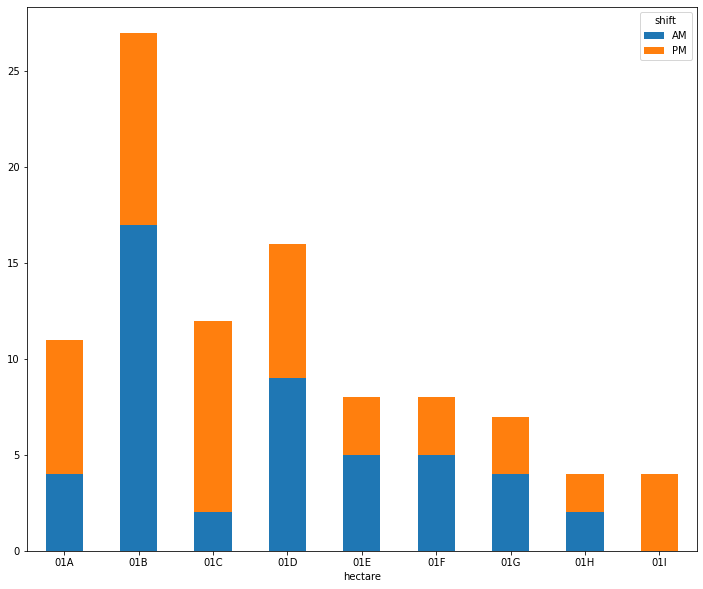

In [149]:
freq_check_01_pivot.plot.bar(stacked = True, 
                             rot = 0,
                             figsize = (12, 10))

In [150]:
nyc_gdf1.get('hectare')

0       37E
1       02E
2       05D
3       33H
4       06G
       ... 
2963    30B
2964    19A
2965    22D
2966    29B
2967    05E
Name: hectare, Length: 2968, dtype: object

<AxesSubplot:>

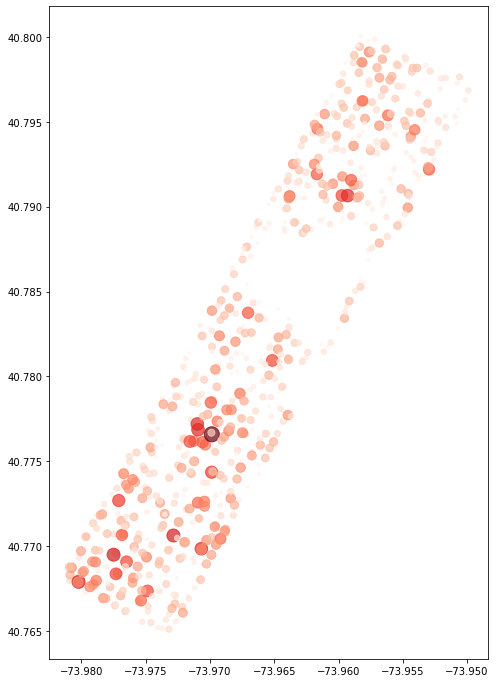

In [151]:
freq_check_gdf.plot(column = 'count', 
                    markersize = 'markersize',
                    cmap = 'Reds',
                    figsize = (12, 12),
                    alpha = 0.7)

## exporting hectare groupby data as csv for ArcGIS

1. reset index
2. groupby
3. add frequency as a column and reset index

In [152]:
nycsquirrels_hectare_groupby = nyc_gdf3.reset_index()
hectare_freq
nyc_hectare_groupby = nycsquirrels_hectare_groupby.set_index('hectare').assign(hectare_freq = hectare_freq).reset_index()
nyc_hectare_groupby

,hectare,long,lat,running,chasing,climbing,eating,foraging,kuks,quaas,moans,tail_flags,tail_twitches,approaches,indifferent,runs_from,geometry,hectare_freq
0,01A,-73.980887,40.768198,0.090909,0.181818,0.181818,0.090909,0.363636,0.090909,0.0,0.000000,0.000000,0.272727,0.000000,0.545455,0.272727,POINT (-73.98089 40.76820),11
1,01B,-73.980241,40.767892,0.185185,0.259259,0.185185,0.444444,0.370370,0.000000,0.0,0.000000,0.037037,0.074074,0.037037,0.851852,0.000000,POINT (-73.98024 40.76789),27
2,01C,-73.979395,40.767560,0.083333,0.000000,0.166667,0.083333,0.833333,0.000000,0.0,0.000000,0.083333,0.083333,0.083333,0.083333,0.166667,POINT (-73.97940 40.76756),12
3,01D,-73.978215,40.766933,0.250000,0.125000,0.187500,0.125000,0.500000,0.000000,0.0,0.000000,0.000000,0.375000,0.000000,0.562500,0.000000,POINT (-73.97821 40.76693),16
4,01E,-73.977362,40.766524,0.000000,0.000000,0.250000,0.000000,0.875000,0.000000,0.0,0.000000,0.000000,0.250000,0.125000,0.500000,0.000000,POINT (-73.97736 40.76652),8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
333,42E,-73.953892,40.798174,0.500000,0.000000,0.333333,0.166667,0.833333,0.166667,0.0,0.000000,0.000000,0.000000,0.000000,0.666667,0.333333,POINT (-73.95389 40.79817),6
334,42F,-73.952999,40.798105,0.666667,0.000000,0.000000,0.166667,0.166667,0.000000,0.0,0.000000,0.000000,0.166667,0.000000,0.833333,0.166667,POINT (-73.95300 40.79810),6
335,42G,-73.951835,40.797566,0.500000,0.000000,0.333333,0.166667,0.333333,0.000000,0.0,0.166667,0.000000,0.000000,0.166667,0.333333,0.666667,POINT (-73.95184 40.79757),6
336,42H,-73.950644,40.797517,0.500000,0.333333,0.000000,0.166667,0.333333,0.000000,0.0,0.000000,0.000000,0.333333,0.000000,0.333333,0.500000,POINT (-73.95064 40.79752),6


In [153]:
nyc_hectare_groupby.to_csv('nyc_hectare_groupby.csv', index=False, encoding='utf-8')

# machine learning with given dataset


## osm dataframe dictionary
***all geographic data of central park comes from openstreetmaps*** <br>
* `allwaterosm` = water bodies and streams in cp
* `allplaygosm` = playgrounds in cp
* `allpavedosm` = roads and bike paths in cp (paved highways)
* `alltoiletsosm` = toilets in cp
* `allbuildingosm` = buildings in cp (building = yes) and the met
* `allgardenosm` = gardens in cp (leisure = garden)
* `allwoodsosm` = woods in cp (natural = wood)
* `allfieldosm` = open grassy areas in cp (landuse = grass, landuse = recreation_ground)
* `allbarerockosm` = bare rock areas in cp (natural = bare_rock)

In [154]:
# 1) CLEANING GIVEN DATASET


# a) read data and transform to wgs84
nyc_gdf = gpd.read_file('../dataframes/nycsquirrels_raw.csv') # for raw data map
nyc_gdf = gpd.GeoDataFrame(nyc_gdf, geometry=gpd.points_from_xy(nyc_gdf.long, nyc_gdf.lat))
nyc_gdf1 = nyc_gdf.set_crs('epsg:4326')


# b) convert fake bools (string) into 0s and 1s
behaviors = ['approaches', 'indifferent', 'runs_from',
             'running', 'chasing', 'climbing', 'eating', 'foraging',
             'kuks', 'quaas', 'moans', 'tail_flags', 'tail_twitches']

behavior_to_int = pd.DataFrame(
    {behavior: nyc_gdf1[behavior].apply(lambda x: 1 if x == 'True' else 0) for behavior in behaviors})
nyc_gdf1.update(behavior_to_int)

# c) convert fake floats (string) to floats
long_float = nyc_gdf1['long'].apply(lambda x: float(x))
lat_float = nyc_gdf['lat'].apply(lambda x: float(x))

nyc_gdf1 = nyc_gdf1.assign(long=nyc_gdf1['long'].apply(lambda x: float(x)),
                           lat=nyc_gdf['lat'].apply(lambda x: float(x)))


# 2) ADDING OSM DATA


# load geojson datasets

centralpark = gpd.read_file('../geojson/centralpark.geojson')
water_osm = gpd.read_file('../geojson/water_cp.geojson')
stream_osm = gpd.read_file('../geojson/streams_cp.geojson')
playg_osm = gpd.read_file('../geojson/playgrounds_cp.geojson')
paved_osm = gpd.read_file('../geojson/paved.geojson')
toilets_osm = gpd.read_file('../geojson/toilets.geojson')
northbd_osm = gpd.read_file('../geojson/northbd.geojson')  # cp north
jorbd_osm = gpd.read_file('../geojson/jorbd.geojson')  # jacqueline kennedy onassis reservoir
greatlawnbd_osm = gpd.read_file('../geojson/greatlawnbd.geojson')  # great lawn
ramblebd_osm = gpd.read_file('../geojson/ramblebd.geojson')  # ramble
southbd_osm = gpd.read_file('../geojson/southbd.geojson')  # cp south
met_osm = gpd.read_file('../geojson/met.geojson')  # museums (MET and others outside)
gardens_osm = gpd.read_file('../geojson/gardens_cp.geojson')
woods_osm = gpd.read_file('../geojson/woods_cp.geojson')
baseball_osm = gpd.read_file('../geojson/baseballpitch.geojson')
grass_osm = gpd.read_file('../geojson/field.geojson')
barerock_osm = gpd.read_file('../geojson/bare_rock.geojson')
pedestrian_osm = gpd.read_file('../geojson/pedestrian.geojson')
sportscenter_osm = gpd.read_file('../geojson/sportscenter.geojson')

In [155]:
# b) select for features in central park
centralpark_poly = centralpark.take([1])
centralpark_perimeter = centralpark_poly.unary_union.convex_hull


# c) fix invalid geometries
def fix_invalid(df, index):
    fixed = df.geometry[index].buffer(0)
    new_geom = df.geometry
    new_geom[index] = fixed
    df.geometry = new_geom


fix_invalid(woods_osm, 1)
fix_invalid(pedestrian_osm, 0)


# 3) SELECT ALL FEATURES WITHIN CENTRAL PARK


cp_water = water_osm[water_osm.within(centralpark_perimeter)].assign(feature_type='water')
cp_stream = stream_osm[stream_osm.within(centralpark_perimeter)].assign(feature_type='water')
cp_playg = playg_osm[playg_osm.within(centralpark_perimeter)].assign(feature_type='playground')
cp_paved_within = paved_osm[paved_osm.within(centralpark_perimeter)].assign(feature_type='paved')
cp_paved_intersect = paved_osm[paved_osm.intersects(centralpark_perimeter)].assign(feature_type='paved')
cp_paved = pd.concat([cp_paved_within, cp_paved_intersect]).drop_duplicates()
cp_toilets = toilets_osm[toilets_osm.within(centralpark_perimeter)].assign(feature_type='toilet')
cp_building = pd.concat([northbd_osm[northbd_osm.within(centralpark_perimeter)],
                         jorbd_osm[jorbd_osm.within(centralpark_perimeter)],
                         greatlawnbd_osm[greatlawnbd_osm.within(centralpark_perimeter)],
                         ramblebd_osm[ramblebd_osm.within(centralpark_perimeter)],
                         southbd_osm[southbd_osm.within(centralpark_perimeter)],
                         met_osm[met_osm.within(centralpark_perimeter)]]).assign(feature_type='building')
cp_garden = gardens_osm[gardens_osm.within(centralpark_perimeter)].assign(feature_type='garden')
cp_woods = woods_osm[woods_osm.within(centralpark_perimeter)].assign(feature_type='woods')
cp_baseballpitch = baseball_osm[baseball_osm.within(centralpark_perimeter)].assign(feature_type='baseball')
cp_grass = grass_osm[grass_osm.within(centralpark_perimeter)].assign(feature_type='grass')
cp_barerock = barerock_osm[barerock_osm.within(centralpark_perimeter)].assign(feature_type='bare rock')
cp_pedestrian_within = pedestrian_osm[pedestrian_osm.within(centralpark_perimeter)].assign(feature_type='pedestrian')
cp_pedestrian_intersect = pedestrian_osm[pedestrian_osm.intersects(centralpark_perimeter)].assign(feature_type='pedestrian')
cp_pedestrian = pd.concat([cp_pedestrian_within, cp_pedestrian_intersect]).drop_duplicates()
cp_sportscenter = sportscenter_osm[sportscenter_osm.within(centralpark_perimeter)].assign(feature_type='sports center')
cp = centralpark_poly.assign(feature_type='central park')

all_features = [cp_water,
                cp_stream,
                cp_playg,
                cp_paved,
                cp_toilets,
                cp_building,
                cp_garden,
                cp_woods,
                cp_baseballpitch,
                cp_grass,
                cp_barerock,
                cp_pedestrian,
                cp_sportscenter,
                cp]


# 4) CONCATENATE AND SAVE AS ALL/RELEVANT FEATURES


cp_allfeatures = pd.concat(all_features)
cp_allfeatures = (
    cp_allfeatures[np.array(
        [not isinstance(geom_object, shapely.geometry.point.Point)
         for geom_object in cp_allfeatures.geometry])] # removes points
)[['id', 'geometry', 'name', 'feature_type']].reset_index().drop(columns='index')

relev_features = ['building', 'garden', 'grass', 'pedestrian', 'water', 'woods']

cp_allfeatures.replace({'feature_type': 'stream'}, 'water', inplace=True)
cp_features = (
    cp_allfeatures.query('feature_type in @relev_features')
                  .sort_values(by='feature_type')
                  .reset_index(drop=True))

In [156]:
import pyproj
import math

# 1) REMOVING SQUIRRELS OUTSIDE OF CENTRAL PARK


squirrel_inside = nyc_gdf1.within(centralpark_perimeter)
nyc_gdf1 = nyc_gdf1.assign(inside=squirrel_inside)
nyc_gdf1 = nyc_gdf1[nyc_gdf1.get('inside')==True]


# 2) DETERMINING BEST BUFFER


# a) find area of each polygon (area dependent buffer size)
planar_features = cp_features.to_crs('epsg:2263')
planar_features['area'] = planar_features.geometry.area


# b) define buffer function (variable)
def calculate_buffer_radius(area, power, factor, cap, base):
    # buffer_counter[0] = factor
    if area == 0:
        return base
    math_func = math.pow(area, power) * factor
    if math_func > cap:
        return cap
    return math_func


# c) configure to projection crs
planar_crs = pyproj.CRS('epsg:2263')
geo_crs = pyproj.CRS('epsg:4326')
project = pyproj.Transformer.from_crs(
    geo_crs, planar_crs, always_xy=True).transform

geospatial_analysis = ['nearbuilding',
                       'neargarden',
                       'neargrass',
                       'nearpedestrian',
                       'nearwater',
                       'nearwoods']

# for i in range(1, 40, 1):
# factor = i/10
# buffer_counter = [0]

# d) apply buffer function
planar_features['buffer_radius'] = planar_features['area'].apply(
    calculate_buffer_radius, power=0.4, factor=1.2, cap=150, base=50)


# e) define buffer analysis function on planar projected points_df
# for each polygon in relevant features
def buffer_analysis(points_df):
    """
    Modifies points_df to include boolean values of whether the point is in the buffer
    :param points_df: dataframe with the points to buffer
    :return: a dataframe of buffer radius and buffer geometry for each polygon
    """
    buffer_geoseries = np.array([])

    for i in range(len(relev_features)):
        temp = planar_features[planar_features['feature_type'] == relev_features[i]].reset_index()
        temp_array = np.array([])

        for j in range(len(temp)):
            temp_array = np.append(temp_array, temp.geometry[j].buffer(temp['buffer_radius'][j]))

        buffer_geoseries = np.append(buffer_geoseries, temp_array)
        buffer_gpd = gpd.GeoDataFrame(geometry=buffer_geoseries)
        temp_gpd = gpd.GeoDataFrame(geometry=temp_array)
        temp_planar_buffer = temp_gpd.geometry.unary_union
        # creating buffer columns
        points_df[geospatial_analysis[i]] = points_df.to_crs('epsg:2263').within(temp_planar_buffer)

    planar_features['buffer_geometry'] = buffer_gpd.geometry

    return planar_features.set_geometry('buffer_geometry').drop(columns='geometry').to_crs('epsg:4326')


# f) create buffer_features for mapping specific buffers
buffer_features = buffer_analysis(nyc_gdf1)


# 3) BUFFERED DATASET PREPARED FOR PERMUTATION TESTS


buffered_nyc_df = nyc_gdf1[['long', 'lat', 'geometry'] + behaviors + geospatial_analysis].to_crs('epsg:4326')

bfsqrls = buffered_nyc_df.query('nearbuilding == True '
                                'or neargarden == True '
                                'or neargrass == True '
                                'or nearpedestrian == True '
                                'or nearwater == True '
                                'or nearwoods == True'
                                ).reset_index().drop(columns='index')

bfsqrls = bfsqrls.drop(columns=['kuks', 'quaas', 'moans', 'tail_flags', 'tail_twitches'])

In [180]:


# 1) DEFINE FUNCTIONS FOR GENERALIZED MAPPING


# a) GeoJson object
def geojson_to_map_obj(df, one_feature, folium_obj, color_var, fill_op):
    """
    Adds a GeoJson object to the folium_map
    :param df: geopandas DataFrame that contains geometry for each shapely object and a column called 'feature_type'
    :param one_feature: type of feature
    :param folium_obj: folium map or feature group
    :param color_var: color of the GeoJson object
    :param fill_op: opacity of the GeoJson object
    :return:
    """
    if one_feature == 'central park':
        fill_op = 0
    gen_stylefunc = lambda x: {'color': color_var, 'fillOpacity': fill_op}
    to_geojson = folium.GeoJson(
        df[df['feature_type'] == one_feature],
        name=one_feature,
        style_function=gen_stylefunc)
    to_geojson.add_to(folium_obj)
    return


# b) FeatureGroup object
def featuregroup_to_map(df, one_feature, folium_map, color_var, fill_op):
    """
    Adds a FeatureGroup object to the folium_map.
    More versatile than a GeoJson object because you can keep adding things
    into the FeatureGroup and treat it as one layer
    :param df: geopandas DataFrame that contains geometry for each shapely object
    :param one_feature: type of feature
    :param folium_map: folium map
    :param color_var: color of the object
    :param fill_op: opacity of the object
    :return:
    """
    featuregroup = folium.FeatureGroup(name=one_feature)
    geojson_to_map_obj(df, one_feature, featuregroup, color_var, fill_op)
    featuregroup.add_to(folium_map)
    return featuregroup


# 2) MAP RAW DATA


raw_data_map = folium.Map(
    location=[40.7823, -73.96600],
    zoom_start=14,
    min_zoom=14,
    tiles='cartodbpositron',
    control_scale=True)

all_squirrels = folium.FeatureGroup(name="squirrels")

nyc_gdf = nyc_gdf.set_crs('epsg:4326')

for i in range(len(nyc_gdf)):
    folium.Circle(
        location=(nyc_gdf.iloc[i]['lat'], nyc_gdf.iloc[i]['long']),
        radius=2,
        tooltip=Tooltip('<p>' + str(dict(nyc_gdf.iloc[i])).replace(',', '<br>') + '<p>')
    ).add_to(all_squirrels)

all_squirrels.add_to(raw_data_map)


# 3) MAP FEATURES


# a) all features


cp_allfeaturesmap = folium.Map(
    location=[40.7823, -73.96600],
    zoom_start=14,
    min_zoom=14,
    tiles='cartodbpositron',
    control_scale=True
)

all_features = list(cp_allfeatures['feature_type'].unique())
all_colors = {'building': '#ad6f03',
              'garden': '#ff8cec',
              'grass': '#86b35d',
              'pedestrian': '#000000',
              'water': '#1795e8',
              'stream': '#1795e8',
              'woods': '#098f57',
              'paved': '#000000',
              'baseball': '#e0cdb4',
              'playground': '#f5931b',
              'sports center': '#960000',
              'bare rock': '#525252',
              'toilet': '#103b91',
              'central park': '#000000'}

for feature in all_features:
    geojson_to_map_obj(
        cp_allfeatures,
        feature,
        cp_allfeaturesmap,
        all_colors[feature],
        0.6
    )

folium.LayerControl().add_to(cp_allfeaturesmap)


# b) relevant features


cp_featuresmap = folium.Map(
    location=[40.7823, -73.96600],
    zoom_start=14,
    min_zoom=14,
    tiles='cartodbpositron',
    control_scale=True
)

for relev_feature in relev_features:
    geojson_to_map_obj(
        cp_features,
        relev_feature,
        cp_featuresmap,
        all_colors[relev_feature],
        0.6
    )

folium.LayerControl().add_to(cp_featuresmap)


# 4) MAP BUFFERS


buffermap = folium.Map(
    location=[40.7823, -73.96600],
    zoom_start=14,
    min_zoom=14,
    tiles='cartodbpositron',
    control_scale=True
)


for relev_feature in relev_features:
    buffer_fg = featuregroup_to_map(
        buffer_features,
        relev_feature,
        buffermap,
        all_colors[relev_feature],
        0.2
    )
    geojson_to_map_obj(
        cp_features,
        relev_feature,
        buffer_fg,
        all_colors[relev_feature],
        0.6
    )




# 5) MAP SQUIRRELS INSIDE BUFFER


squirrels_buffered_map = folium.Map(
    location=[40.7823, -73.96600],
    zoom_start=14,
    min_zoom=14,
    tiles='cartodbpositron',
    control_scale=True
)

squirrels_in_buffer = folium.FeatureGroup(name='squirrels remaining')
squirrels_notin_buffer = folium.FeatureGroup(name='all squirrels')

for i in range(len(bfsqrls)):
    folium.Circle(
        location=(bfsqrls.iloc[i]['lat'], bfsqrls.iloc[i]['long']),
        color='#FF4B4B',
        radius=2).add_to(squirrels_in_buffer)

for i in range(len(nyc_gdf1)):
    folium.Circle(
        location=(nyc_gdf1.iloc[i]['lat'], nyc_gdf1.iloc[i]['long']),
        color='#63401c',
        opacity=1.0,
        radius=0.5).add_to(squirrels_notin_buffer)

squirrels_notin_buffer.add_to(buffermap)

folium.LayerControl().add_to(buffermap)
buffermap
buffermap.save('../maps/buffer_postermap.html')

In [181]:
buffermap

In [37]:
osmcp = folium.Map(location=[40.783121, -73.965750], zoom_start=14, max_zoom=15)

In [38]:
epsg2263_nyc_gdf2 = nyc_gdf2.to_crs('epsg:2263')


epsg2263_allwaterosm = allwaterosm.to_crs('epsg:2263')
allwaterosm_buffer = epsg2263_allwaterosm.geometry.buffer(100)
folium.GeoJson(allwaterosm_buffer).add_to(osmcp)

waterbufferunion = allwaterosm_buffer.geometry.unary_union
sqrinwater = epsg2263_nyc_gdf2.within(waterbufferunion)

# folium.GeoJson(epsg2263_nyc_gdf2.loc[sqrinwater])

#base_water = allwaterosm.plot(figsize=(24,24))

#nyc_gdf2.plot(ax = base, color = 'gray')

nyc_gdf2.loc[sqrinwater].plot(ax = base, color = 'red')

NameError: name 'nyc_gdf2' is not defined

In [39]:
# Turn group of polygons into single multipolygon
my_union = onehundredftbuffer.geometry.unary_union
#print('Type:', type(my_union))

# Show the MultiPolygon object
onehundredftbuffergdf = gpd.GeoDataFrame(onehundredftbuffer).assign(geometry = onehundredftbuffer).get(['geometry'])
squirrelinwater = distance_nyc_gdf2.within(my_union)

base_1 = allwaterosm.to_crs('epsg:2263').explore()

folium.GeoJson(distance_nyc_gdf2).add_to(base_1)

folium.GeoJson(distance_nyc_gdf2.loc[squirrelinwater]).add_to(base_1)

# distance_nyc_gdf2.plot(ax = base_1, color='gray')

# distance_nyc_gdf2.loc[squirrelinwater].plot(ax = base_1, color='red')

print(len(distance_nyc_gdf2.loc[squirrelinwater]) / len(distance_nyc_gdf2))


NameError: name 'onehundredftbuffer' is not defined

In [40]:
bufferconv_nyc_gdf2 = nyc_gdf2.to_crs('epsg: 2263')

# areas where squirrels may be found

bufferconv_cprock = centralparkrock.to_crs('epsg: 2263')
geom_cprock = bufferconv_cprock.geometry
geom_cprock_union = geom_cprock.geometry.unary_union
squirrelinrock = bufferconv_nyc_gdf2.within(geom_cprock_union)

bufferconv_cpfields = centralparkfields.to_crs('epsg: 2263')
geom_cpfields = bufferconv_cpfields.geometry
geom_cpfields_union = geom_cpfields.geometry.unary_union
squirrelinfields = bufferconv_nyc_gdf2.within(geom_cpfields_union)

bufferconv_cpwoods = centralparkwoods.to_crs('epsg: 2263')
geom_cpwoods = bufferconv_cpwoods.geometry
geom_cpwoods_union = geom_cpwoods.geometry.unary_union
squirrelinwoods = bufferconv_nyc_gdf2.within(geom_cpwoods_union)

bufferconv_cpgarden = centralparkgarden.to_crs('epsg: 2263')
geom_cpgarden = bufferconv_cpgarden.geometry
geom_cpgarden_union = geom_cpgarden.geometry.unary_union
squirrelingarden = bufferconv_nyc_gdf2.within(geom_cpgarden_union)

bufferconv_cppg = centralparkplayg.to_crs('epsg: 2263')
geom_cppg = bufferconv_cppg.geometry
geom_cppg_union = geom_cppg.geometry.unary_union
squirrelinpg = bufferconv_nyc_gdf2.within(geom_cppg_union)

bufferconv_cppede = centralparkpedestrian.to_crs('epsg: 2263')
geom_cppede = bufferconv_cppede.geometry
geom_cppede_union = geom_cppede.geometry.unary_union
squirrelinpedestrian = bufferconv_nyc_gdf2.within(geom_cppede_union)

bufferconv_cpbaseball = centralparkbaseball.to_crs('epsg: 2263')
geom_cpbaseball = bufferconv_cpbaseball.geometry
geom_cpbaseball_union = geom_cpbaseball.geometry.unary_union
squirrelinbaseball = bufferconv_nyc_gdf2.within(geom_cpbaseball_union)

bufferconv_cpsp = centralparkspcenter.to_crs('epsg: 2263')
geom_cpsp = bufferconv_cpsp.geometry
geom_cpsp_union = geom_cpsp.geometry.unary_union
squirrelinspcenter = bufferconv_nyc_gdf2.within(geom_cpsp_union)

bufferconv_cptoilet = centralparktoilet.to_crs('epsg: 2263')
geom_cptoilet = bufferconv_cptoilet.geometry
geom_cptoilet_union = geom_cptoilet.geometry.unary_union
squirrelintoilet = bufferconv_nyc_gdf2.within(geom_cptoilet_union)

# areas where squirrels shouldn't be in 

bufferconv_cpbuild = centralparkbuilding.to_crs('epsg: 2263')
geom_cpbuild = bufferconv_cpbuild.geometry
geom_cpbuild_union = geom_cpbuild.geometry.unary_union
squirrelinbuilding = bufferconv_nyc_gdf2.within(geom_cpbuild_union)

bufferconv_cpwater = centralparkwater.to_crs('epsg: 2263')
geom_cpwater = bufferconv_cpwater.geometry
geom_cpwater_union = geom_cpwater.geometry.unary_union
squirrelinwater = bufferconv_nyc_gdf2.within(geom_cpwater_union)

NameError: name 'nyc_gdf2' is not defined

In [41]:
rock_area = sum(bufferconv_cprock['geometry'].area)
sum(squirrelinrock) / rock_area

NameError: name 'bufferconv_cprock' is not defined

In [42]:
fields_area = sum(bufferconv_cpfields['geometry'].area)
sum(squirrelinfields) / fields_area

NameError: name 'bufferconv_cpfields' is not defined

In [43]:
woods_area = sum(bufferconv_cpwoods['geometry'].area)
sum(squirrelinwoods) / woods_area

NameError: name 'bufferconv_cpwoods' is not defined

In [44]:
garden_area = sum(bufferconv_cpgarden['geometry'].area)
sum(squirrelingarden) / garden_area

NameError: name 'bufferconv_cpgarden' is not defined

In [ ]:
pg_area = sum(bufferconv_cppg['geometry'].area)
sum(squirrelinpg) / pg_area

In [45]:
build_area = sum(bufferconv_cpbuild['geometry'].area)
sum(squirrelinbuilding) / build_area

NameError: name 'bufferconv_cpbuild' is not defined

In [46]:
water_area = sum(bufferconv_cpwater['geometry'].area)
sum(squirrelinwater) / water_area

NameError: name 'bufferconv_cpwater' is not defined

In [47]:
sum(squirrelinrock), sum(squirrelinfields), sum(squirrelinwoods), sum(squirrelingarden), sum(squirrelinpg), \
sum(squirrelinbuilding), sum(squirrelinwater), sum(squirrelinpedestrian), sum(squirrelinbaseball), \
                            sum(squirrelinspcenter), sum(squirrelintoilet)

NameError: name 'squirrelinrock' is not defined

In [48]:
bufferconv_cp = centralpark_osm.take([1]).to_crs('epsg: 2263')
cp_area = sum(bufferconv_cp['geometry'].area)

NameError: name 'centralpark_osm' is not defined

In [49]:
('bare_rock', rock_area/cp_area), ('fields and grass', fields_area/cp_area), \
('woods', woods_area/cp_area), ('garden', garden_area/cp_area), \
('playground', pg_area/cp_area), ('building', build_area/cp_area), ('water', water_area/cp_area)

NameError: name 'rock_area' is not defined

In [50]:
water_gdf = bufferconv_nyc_gdf2.assign(inwater = squirrelinwater)
water_gdf[water_gdf.get('inwater') == True].explore()

NameError: name 'bufferconv_nyc_gdf2' is not defined

In [51]:
building_gdf = bufferconv_nyc_gdf2.assign(inbuilding = squirrelinbuilding)
building_gdf[building_gdf.get('inbuilding') == True].explore()

NameError: name 'bufferconv_nyc_gdf2' is not defined

In [52]:
centralpark_osm

NameError: name 'centralpark_osm' is not defined

In [53]:
centralparkperimeter = centralpark_osm[centralpark_osm.get('id') == 'way/427818536']

bufferconv_cpperi = centralparkperimeter.to_crs('epsg: 2263')
geom_cpperi = bufferconv_cpperi.geometry
geom_cpperi_union = geom_cpperi.geometry.unary_union
squirrelinside = bufferconv_nyc_gdf2.within(geom_cpperi_union)

NameError: name 'centralpark_osm' is not defined

In [54]:
outside = bufferconv_nyc_gdf2.assign(inside = squirrelinside)
outside[outside.get('inside') == False].explore()

NameError: name 'bufferconv_nyc_gdf2' is not defined

In [55]:
centralparkpaved = centralparkpaved.to_crs('epsg: 2263')

centralpark_perimeter = centralparkpaved[(centralparkpaved.get('name') == '5th Avenue') |
                                         (centralparkpaved.get('name') == 'Central Park North') |
                                         (centralparkpaved.get('name') == 'Central Park West') |
                                         (centralparkpaved.get('name') == 'Central Park South') |
                                         (centralparkpaved.get('name') == 'Grand Army Plaza') |
                                         (centralparkpaved.get('name') == 'Doris C. Freedman Place') |
                                         (centralparkpaved.get('name') == 'Duke Ellington Circle')]

NameError: name 'centralparkpaved' is not defined

In [56]:
centralparkperi = centralpark_perimeter.unary_union.convex_hull
squirrelinside = bufferconv_nyc_gdf2.within(centralparkperi)

NameError: name 'centralpark_perimeter' is not defined

In [57]:
inside_gdf = bufferconv_nyc_gdf2.assign(inside = squirrelinside)
inside_gdf[inside_gdf.get('inside') == False].explore()

NameError: name 'bufferconv_nyc_gdf2' is not defined

In [58]:
rock_gdf = bufferconv_nyc_gdf2.assign(rock = squirrelinrock)
rock_gdf[rock_gdf.get('rock') == True]

NameError: name 'bufferconv_nyc_gdf2' is not defined